
## Questions

#### 1. Forecast oil production in Norway (35 Marks)
The file "Energy Data.csv" contains yearly data on Oil Production (Prefix OilP) for Norway, OPEC countries and the entire World, World and Norwegian Gas Production (Prefix GasP) and Oil Consumption in Norway, Europe and the World (Prefix OilC) from the Energy Institute Statistical Review of World Energy ([webpage](https://www.energyinst.org/statistical-review)). Oil Consumption and Production are measured in million barrels per day, gas production in BCM. 
    
a) Load the data, clean it and create two plots, one plot for oil and gas production and a second plot for oil consumption. Transform the data into 1st differences. For the remainder of the exercise, use the resulting series. (5 Marks)

b) Write two functions to support the analysis of Neural Networks (5 Marks): 

    1. The first function should display loss and accuracy across epochs of one or more Neural Network. Call the function 'EpochsCompare'.
    
    2. The second function should display the Root Mean Squared Error (RMSE) of one or more predicted series. The first input should be the true (observed) series, the second inputs the predicted series. Call the function 'CalculateRMSE'.

c) Build two Recurrent Neural Network (RNN) to forecast oil production as an AR(2) process. The first RNN should have 2 hidden layers, the second one 4 hidden layers. Comment on the type of activation you are using. For both, identify the optimal number of epochs using the 'EpochsCompare' function. (5 Marks)

d) Add world oil consumption in Norway, Europe and the World as additional variables, plus OPEC oil production and the gas production series. (5 Marks)

e) Add LSTM cells to the neural networks from question 1.c) and 1.d). Allow for return sequences. (5 Marks)

f) Compare the results from question 1.b), 1.c) and 1.d) using i) Plots and ii) RMSE using the 'CalculateRMSE' function. (10 Marks)

#### 2. Image Classification (35 Marks)
In this exercises we are using the ShipsNet Dataset to classify if a satellite image contains a ship and count the number of ships. The dataset is available [here](https://drive.google.com/file/d/1COjsIS_VKZWWcWoHpXhdXB_cS6q_olZs/view).

a) Build and train a Convolutional Neural Network (CNN) to classify if an image contains a ship or not using the ShipsNet dataset. Discuss the choice of layers and neurons. Report and comment on the accuracy using the EpochsCompare' function. Evaluate the model using a testing sample which is 20% of the true sample. Comment on the type of activation you are using. (10 Marks)

b) On It’s learning you find an Satellite image of the harbour of Singapore (SingaporeHarbour.png). Load the image and split it into 200 80x80 pixel images. Use the CNN from a) to count the number of ships and mark the areas which contains ships. (15 Marks)

c) Verify your prediction using Local Interpretable Model-Agnostic Explanations (LIME). Highlight the areas which fits the prediction in each of the 200 images using the lime verification highlighting. (10 Marks)

#### 3. Autoencoders (30 Marks)
This exercise is an extension to the previous exercise. The aim is to denoise the Satellite Images in the SMPL_Ships folder. 

a) Build an autoencoder using a convolutional neural network with 4 layers. Comment on the type of activation you are using. (10 Marks)

b) Add random noise to the training and test data. Then train the model from a) with the entire ShipsNet dataset (including images of ships and no ships) and with a subsample using ships only. Find the optimal number of epochs for both neural networks using the 'EpochsCompare' function. Discuss your choice on the density of the layers and the size of the kernels. (10 Marks)

c) Add random noise to the Satellite Image of Singapore and use the autoencoders from a) to remove the noise. Then use the CNN from 2 a) to classify the images and present them in the same fashion as you did in exercise 2 b). Compare your results to those obtained in 2 c). (10 Marks)


#### 1.a) Load the data and clean it.  

In [1]:
#############################################################
# Necessary packages
#############################################################

# Task 1 and 2
import pandas as pd
import os 
import sys
import dtale
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import SimpleRNN, Dense, LSTM, Conv2D, MaxPooling2D, Flatten, Dropout, Input, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Task 2 specific
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

# Task 3 specific
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tqdm import tqdm
import random

#############################################################
# Setting working directory, filename and load data
#############################################################
# Define the path to the directory containing _anonymize.py for importing user_name - In order to anonymize
sys.path.append(r"C:\data_path")

# Import the variable
from _anonymize import name__

# Our anonymized "main" data path
data_path = f'C:/Users/{name__}/OneDrive - BI Norwegian Business School (BIEDU)/Desktop/BI-Skole/3 Semester/DL and XAI/HomeExam/'

# Setting file name
file_name = 'EnergyData.csv'

# Read CSV file and importing the data
data = pd.read_csv(os.path.join(data_path, file_name))

#############################################################
# Simple EDA, and cleaning 
#############################################################

# Displaying the whole data set using dtale in a browser
dtale.show(data).open_browser()

# Print out the first rows the data set
print("First 4 rows of data")
print(data.head(4))

# We see that there are some missing values
print("\nCount of missing values")
print(data.isna().sum())

# Check the dtype of each column
print("\n Data types of each column")
print(data.dtypes)

# Get to know the basic statistics of the data set
print(data.describe()) 

# The OilP_Norway is considered an object because of '-', and since it is the first years of oilproduction these can be set to 0 (which makes sense)
data["OilP_Norway"] = data["OilP_Norway"].replace('-',0).astype(float)


###############################################################################################
# From the DTALE, we see that GasP_Norway and Gasp_World contain NaN in the last rows, which we can interpolate using spline of order 1 (after testing with other orders and linearly)
# While it is possible to delete rows containing NA's, we used the interpolastion method to fill the NA's because the data set is very small from beginning
# Instead of making the data set even smaller by deleting rows, we instead run the risk of using "false data" than to reduce the data set. And our interpolation method did produce reasonable results
###############################################################################################
data["GasP_Norway"] = data["GasP_Norway"].interpolate(method="spline", order=1)
data["GasP_World"] = data["GasP_World"].interpolate(method="spline", order=1)

# Print out the first rows the data set
print("Last 4 rows of data, where we can see that spline of order 1 created realistic values for NaN")
print(data.tail(4))

# Displaying the whole data set using dtale in a browser to see the whole dataset after tranformations
dtale.show(data).open_browser()

# Setting Year as the index for easier plotting and not confusing the algorithms later as a variable
data.set_index("Year", inplace=True)


c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



First 4 rows of data
   Year OilP_Norway    OilP_OPEC   OilP_World  GasP_Norway   GasP_World  \
0  1965           -  13700.65310  31791.90699          0.0   976.087989   
1  1966           -  15110.98559  34560.92942          0.0  1044.118252   
2  1967           -  16111.73047  37103.66135          0.0  1095.547059   
3  1968           -  17987.00451  40418.29886          0.0  1148.269577   

   OilC_Norway   OilC_Europe   OilC_World  
0    99.449452   8218.738084  30884.72873  
1   112.014493   9037.163614  33315.00765  
2   116.585671   9825.434256  35641.94069  
3   129.531913  10775.276770  38529.93031  

Count of missing values
Year           0
OilP_Norway    0
OilP_OPEC      0
OilP_World     0
GasP_Norway    1
GasP_World     5
OilC_Norway    0
OilC_Europe    0
OilC_World     0
dtype: int64

 Data types of each column
Year             int64
OilP_Norway     object
OilP_OPEC      float64
OilP_World     float64
GasP_Norway    float64
GasP_World     float64
OilC_Norway    float64
Oil

#### 1. a) Create two plots, one for oil and gas production and one for oil consumption.

Production

**NB**: The task asked us for creating two plots, where we understood it as to plot oil and gas production values together in one plot. However, we think it is more logical and readable to separate these graphs into oil production and gas production, especially since there is a sizable difference between the production numbers between oil and gas which could distort interpretation.

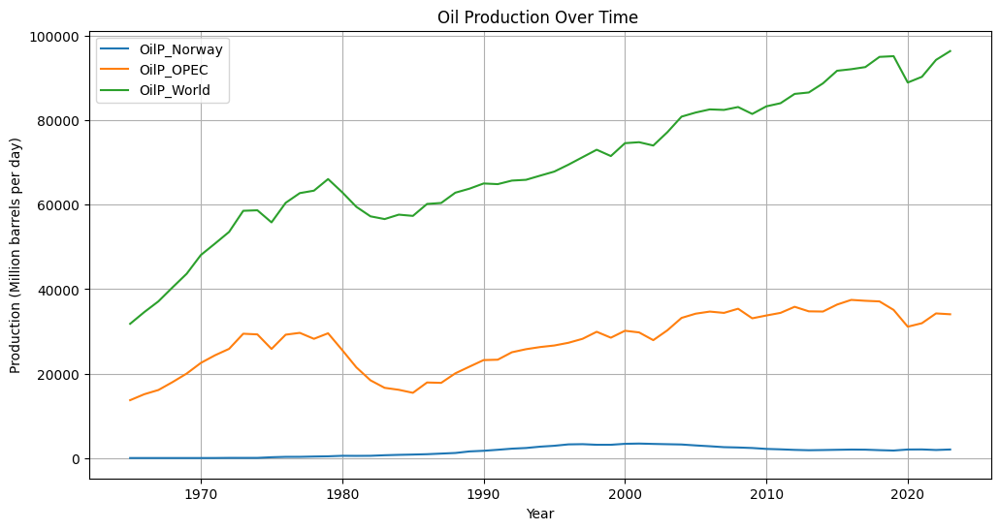

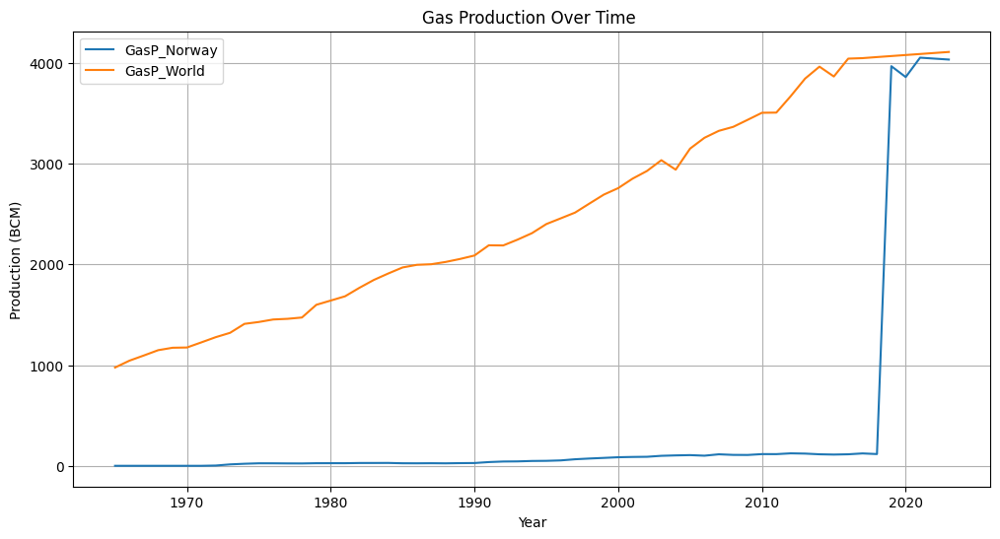

In [2]:
# Columns for oil and gas production
productionOil_columns = ['OilP_Norway', 'OilP_OPEC', 'OilP_World']
productionGas_columns = ['GasP_Norway', 'GasP_World']

# Extract data for plotting
productionOil_data = data[productionOil_columns]
productionGas_data = data[productionGas_columns]

# Plot Oil Production
plt.figure(figsize=(12, 6))
for column in productionOil_columns:
    plt.plot(productionOil_data.index, productionOil_data[column], label=column)

plt.title('Oil Production Over Time ')
plt.xlabel('Year')
plt.ylabel('Production (Million barrels per day)')
plt.legend()
plt.grid(True)
plt.show()

# Plot Gas Production
plt.figure(figsize=(12, 6))
for column in productionGas_columns:
    plt.plot(productionGas_data.index, productionGas_data[column], label=column)

plt.title('Gas Production Over Time ')
plt.xlabel('Year')
plt.ylabel('Production (BCM)')
plt.legend()
plt.grid(True)
plt.show()

Consumption

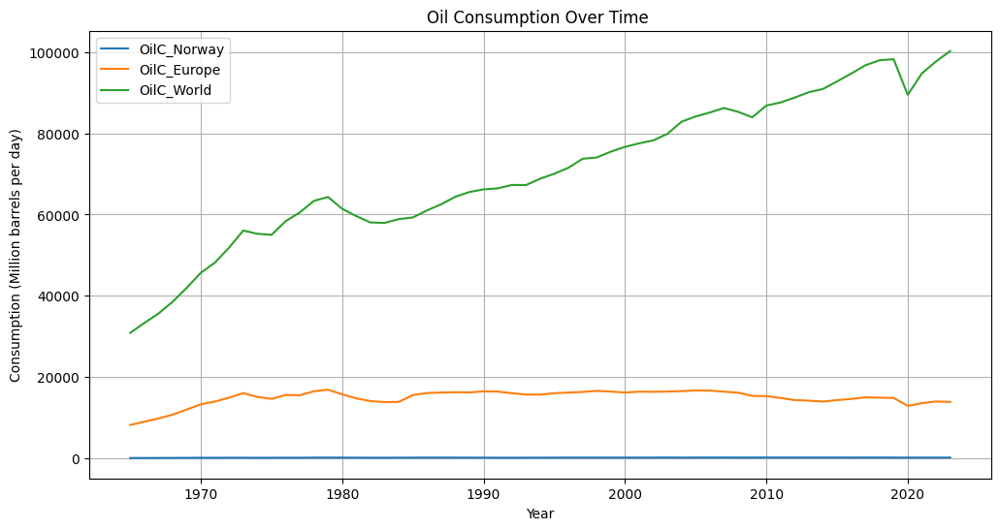

In [3]:
# Columns for oil consumption
consumption_columns = ['OilC_Norway', 'OilC_Europe', 'OilC_World']

# Extract data for plotting
consumption_data = data[consumption_columns]

# Plot Oil Consumption
plt.figure(figsize=(12, 6))
for column in consumption_columns:
    plt.plot(consumption_data.index, consumption_data[column], label=column)

plt.title('Oil Consumption Over Time ')
plt.xlabel('Year')
plt.ylabel('Consumption (Million barrels per day)')
plt.legend()
plt.grid(True)
plt.show()

#### 1.a) Transform data into 1st differences.

In [4]:
# Take the first differences, and drop the first row since diff will introduce NaN there
data_diff = data.diff().dropna() 

##### 1. b) Function 'EpochsCompare'



**NB**: Our RNN and LSTM does not accept the Accuracy arguement when we compile the model, so in order to work around these error messages we use MAE as a value for "accuracy" for the metrics variable.

In [5]:
def EpochsCompare(histories, model_labels):
    """
    Our function takes the parameter 'histories' and 'model_labels', which is a list of history objects returned by model.fit() and their costum labels
    """
    ### Plot Loss (MSE) ###
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    for history, label in zip(histories, model_labels):
        plt.plot(history.history["loss"], label=f"{label} Loss")
    plt.title("Training Loss (MSE) Across Different Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    ### Plot Accuracy or MAE ###
    plt.subplot(1, 2, 2)
    for history, label in zip(histories, model_labels):
        # Check if it is the accuracy or just mae(for regression)
        metric = history.history.get("accuracy", history.history.get("mae", None))
        plt.plot(metric, label=f"{label} Accuracy")
    plt.title("Training Accuracy (MAE) Across Different Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

##### 1. b) Function 'CalculateRMSE'

In [6]:
def CalculateRMSE(true_series, predicted_series):
    """
    Our function takes the parameters:
    - true_series = The true values
    - predicted_series = one or more predicted series
    """
    # Number of models will be labeled numerically
    num_models = len(predicted_series)
    model_labels = [f"Model {i+1}" for i in range(num_models)]

    ### RMSE ###
    for i, (pred, label) in enumerate(zip(predicted_series, model_labels)):
        pred = np.array(pred)
        true = np.array(true_series)
        rmse = np.sqrt(np.mean((true - pred)**2))
        print(f"{label}: {round(rmse, 4)}")

#### 1.c) Build a RNN with 2 hidden layers and forecast oil production. 
Notes: For the time series generator, use 2 lags and a batch size of 20. Train the model with the data until 2000. 

**NB**: Since the task do not specify what variable is our target, we found it reasonable to target the Oilproduction in Norway, since we see (from the oil production plot above) that this variable have been consistent the previous years and should be “easier” to forecast. 

In [7]:
#############################################################
# Defining target variable for forecast and splitting data
#############################################################

# We use OilP_Norway as the Target column since the task does not specify others
oil_production_target = data_diff["OilP_Norway"]

# Split the data into training (until year 2000) and test (from 2001 to 2023)
train_data = oil_production_target.loc[:2000]
test_data = oil_production_target.loc[2001:]

#############################################################
# Scaling our data for enhanced performance for the models
#############################################################

# Reshape data for scaling
train_values = train_data.values.reshape(-1, 1)
test_values = test_data.values.reshape(-1, 1)

# Initiate scaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Fit the scaler and transform both training and test data
scaled_train = scaler.fit_transform(train_values)
scaled_test = scaler.transform(test_values)

#############################################################
# TimeSeriesGenerators 
#############################################################

# Number of lags, since this is AR(2)
n_lags = 2

# Batch size according to task description
batch_size = 20

# Create TimeSeriesGenerators for training and test data
train_generator_uni = TimeseriesGenerator(scaled_train, scaled_train, length = n_lags, batch_size=batch_size, shuffle=False)
test_generator_uni = TimeseriesGenerator(scaled_test, scaled_test, length = n_lags, batch_size=batch_size, shuffle=False)

2 - Layer RNN: The density for the RNN layer should be 32, 8 and 4 for the two hidden layers

**NB**: We interpretated this as 32 neurons for the input layer, and 8 & 4 neurons for the two hidden layers and 1 neuron for the output layer (which is an 3-layer RNN and not 2-layer).
We use the 'tanh' activation function because it is effective at capturing non-linearities in the data (which we have seen) and outputs values is between -1 and 1.
Since we are forecasting, we also set the output layer to be linear and the loss in compiling to be MSE.
We also need to set the return_sequences=True for the input layers and all layers except the penultimate, in order to avoid error messages. As a rule of thumb, if the next layer is an RNN layer, the current layer must have return_sequences=True, because RNN layers expect sequential input.

In [8]:
#############################################################
# Additional parameters for both models 
#############################################################
input_shape = (n_lags, 1)
early_stop = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.001, restore_best_weights=True)
learning_rate = 0.001


#############################################################
# Initializing first RNN model with 2 hidden layer
#############################################################
def rnn_2_layers(input_shape):
    model = Sequential()
    model.add(SimpleRNN(32, activation="tanh", return_sequences=True, input_shape=input_shape))
    model.add(SimpleRNN(8, activation="tanh", return_sequences=True))
    model.add(SimpleRNN(4, activation="tanh", return_sequences=False))
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer=Adam(learning_rate), loss="mean_squared_error", metrics=["mae"])
    return model

# Creating the 2 layer RNN
uni_model_2_layers = rnn_2_layers(input_shape)
model_2_layers_uni = uni_model_2_layers.fit(train_generator_uni, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_uni)

c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



4 - Layer RNN: The density for the RNN layer should be 32 and 16, 8, 4 and 2 for the four hidden layers

**NB**: We interpretated this as 32 neurons for the input layer, and 16, 8, 4 and 2 for the four hidden layers, and 1 neuron for the output layer (which is an 5-layer RNN).

In [9]:
# We use the 'tanh' activation function and the return_sequences here as well for the same argument as above
def rnn_4_layers(input_shape):
    model = Sequential()
    model.add(SimpleRNN(32, activation="tanh", return_sequences=True, input_shape=input_shape))
    model.add(SimpleRNN(16, activation="tanh", return_sequences=True))
    model.add(SimpleRNN(8, activation="tanh", return_sequences=True))
    model.add(SimpleRNN(4, activation="tanh", return_sequences=True))
    model.add(SimpleRNN(2, activation="tanh", return_sequences=False))
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer=Adam(learning_rate), loss="mean_squared_error", metrics=["mae"])
    return model


# Creating the 4 layer RNN
uni_model_4_layers = rnn_4_layers(input_shape)
model_4_layers_uni = uni_model_4_layers.fit(train_generator_uni, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_uni)

c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Use a graph to identify the optimal number of epochs using the loss as a criterion.

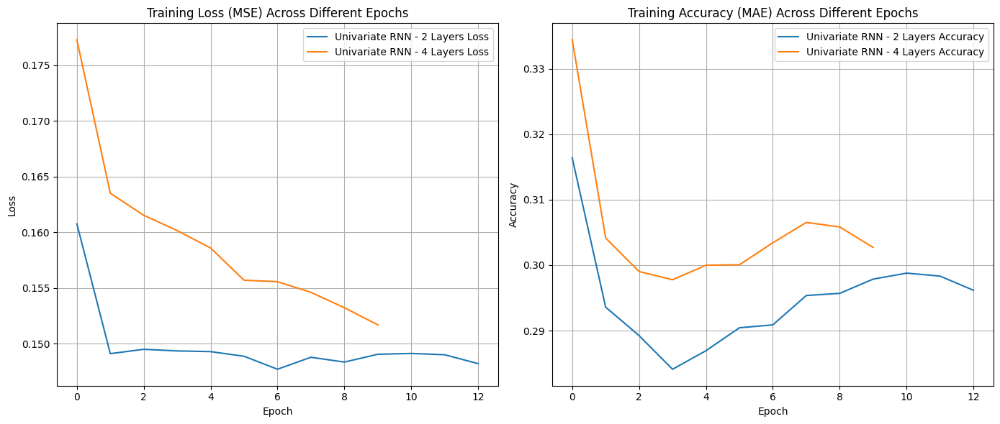

In [10]:
# Setting model labels for easier understanding when plotting
model_labels = [
    "Univariate RNN - 2 Layers",
    "Univariate RNN - 4 Layers"
]

# Calling our function
EpochsCompare([model_2_layers_uni, model_4_layers_uni], model_labels=model_labels)

#### 1.c) Add world oil consumption in Norway, Europe and the World as additional variables, plus OPEC oil production and both gas production series.

Note: you can use the same settings for the neural network as before. Start by defining target and feature matrices and then the time series dataset.

In [11]:
#############################################################
# Defining target and feature variables for forecast and splitting data
#############################################################

# We use OilP_Norway as the Target column since the task does not specify others
oil_production_target = data_diff["OilP_Norway"]

# Other variables as features
oil_production_features = data_diff[["OilC_Norway", "OilC_Europe", "OilC_World",
                      "OilP_OPEC", "GasP_Norway", "GasP_World"]]

# Split the data for target into training (until year 2000) and test (from 2001 to 2023)
train_data_target = oil_production_target.loc[:2000]
test_data_target = oil_production_target.loc[2001:]

# Split the data for features into training (until year 2000) and test (from 2001 to 2023)
train_data_features = oil_production_features.loc[:2000]
test_data_features = oil_production_features.loc[2001:]

#############################################################
# Scaling our data for enhanced performence for the models
#############################################################

# Initiate scaler
scaler_target = MinMaxScaler()
scaler_features = MinMaxScaler(feature_range=(-1, 1))

# Fit the scaler and transform the training data for both target and features
scaled_train_features = scaler_features.fit_transform(train_data_features)
scaled_train_target = scaler_target.fit_transform(train_data_target.values.reshape(-1, 1))

# Transform the test data using the previously fitted scalers
scaled_test_features = scaler_features.transform(test_data_features)
scaled_test_target = scaler_target.transform(test_data_target.values.reshape(-1, 1))

#############################################################
# TimeSeriesGenerators 
#############################################################

# Number of lags, since this is AR(2)
n_lags = 2

# Batch size according to task description
batch_size = 20

# Create TimeSeriesGenerators for training data and test
train_generator_multi = TimeseriesGenerator(scaled_train_features, scaled_train_target, length=n_lags, batch_size=batch_size, shuffle=False)
test_generator_multi = TimeseriesGenerator(scaled_test_features, scaled_test_target, length=n_lags, batch_size=batch_size, shuffle=False)

#############################################################
# Additional parameters for both models 
#############################################################
n_features = scaled_train_features.shape[1]
input_shape_multi = (n_lags, n_features)
early_stop = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.001, restore_best_weights=True)
learning_rate = 0.001


#############################################################
# Initializing the models with the same parameters 
#############################################################
# Creating the 2 layer RNN
multi_model_2_layers = rnn_2_layers(input_shape_multi)
model_2_layers_multi = multi_model_2_layers.fit(train_generator_multi, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_multi)

# Creating the 4 layer RNN
multi_model_4_layers = rnn_4_layers(input_shape_multi)
model_4_layers_multi = multi_model_4_layers.fit(train_generator_multi, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_multi)

c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Use a graph to identify the optimal number of epochs using the loss as a criterion.

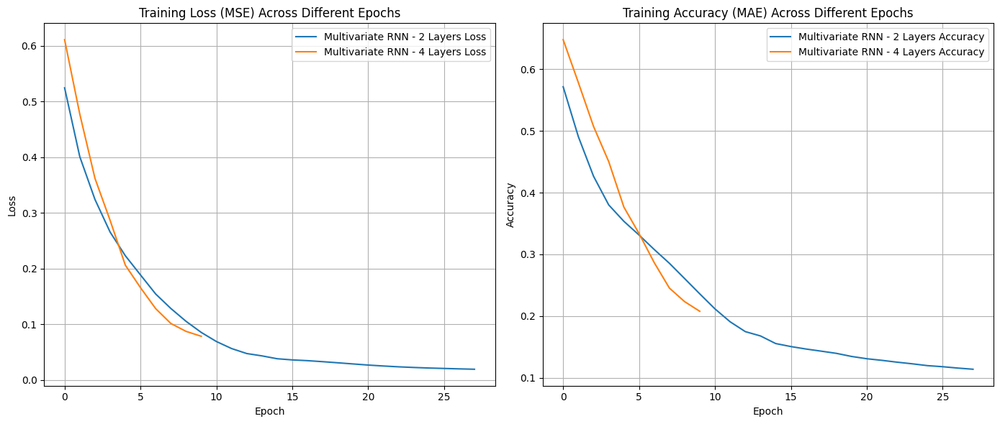

In [12]:
# Setting our model labels
model_labels = [
    "Multivariate RNN - 2 Layers",
    "Multivariate RNN - 4 Layers"]

# Calling our function
EpochsCompare([model_2_layers_multi, model_4_layers_multi], model_labels=model_labels)


#### 1.d) Add LSTM to your model allowing for return sequences. 
Note: do the LSTM for the uni- and multivariate model.

In [13]:
#############################################################
# Defining the LSTM models
#############################################################

# 3 (2) layer LSTM 
def lstm_2_layers(input_shape):
    model = Sequential()
    model.add(LSTM(32, activation="tanh", return_sequences=True, input_shape=input_shape))
    model.add(LSTM(8, activation="tanh", return_sequences=True))
    model.add(LSTM(4, activation="tanh", return_sequences=False))
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer=Adam(learning_rate), loss="mean_squared_error", metrics=["mae"])
    return model

# 5(4) layer LSTM 
def lstm_4_layers(input_shape):
    model = Sequential()
    model.add(LSTM(32, activation="tanh", return_sequences=True, input_shape=input_shape))
    model.add(LSTM(16, activation="tanh", return_sequences=True))
    model.add(LSTM(8, activation="tanh", return_sequences=True))
    model.add(LSTM(4, activation="tanh", return_sequences=True))
    model.add(LSTM(2, activation="tanh", return_sequences=False))
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer=Adam(learning_rate), loss="mean_squared_error", metrics=["mae"])
    return model


#############################################################
# Creating our Uni and Multi models 
#############################################################

# Univariate
uni_lstm_model_2_layers = lstm_2_layers(input_shape)
lstm_model_2_layers_uni = uni_lstm_model_2_layers.fit(train_generator_uni, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_uni)

uni_lstm_model_4_layers = lstm_4_layers(input_shape)
lstm_model_4_layers_uni = uni_lstm_model_4_layers.fit(train_generator_uni, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_uni)


# Multivariate
multi_lstm_model_2_layers = lstm_2_layers(input_shape_multi)
lstm_model_2_layers_multi = multi_lstm_model_2_layers.fit(train_generator_multi, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_multi)

multi_lstm_model_4_layers = lstm_4_layers(input_shape_multi)
lstm_model_4_layers_multi = multi_lstm_model_4_layers.fit(train_generator_multi, epochs=50, callbacks=[early_stop], verbose=0, validation_data=test_generator_multi)

##### 1.e) Compare all 4 models using i) Graphs and ii) the 'CalculateRMSE' function.

**NB**: Since this task does not specify which 4 models we should compare, therefore we have chosen to plot the four RNN models and the four LSTM models. However, the interpretation part of this question only include the RNN, again since the task does not specify which 4 models. 

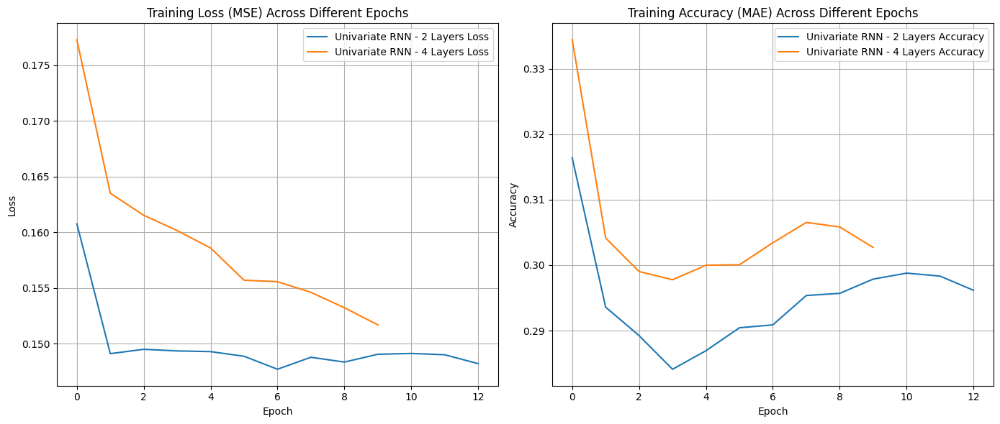

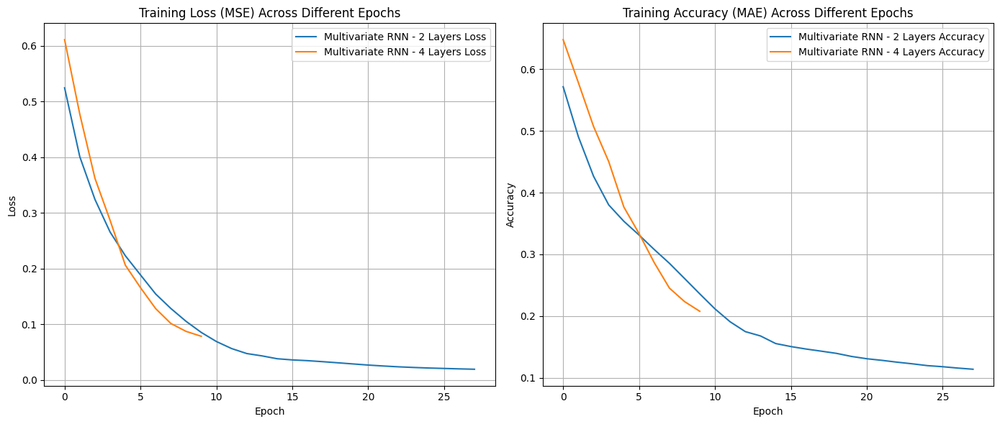

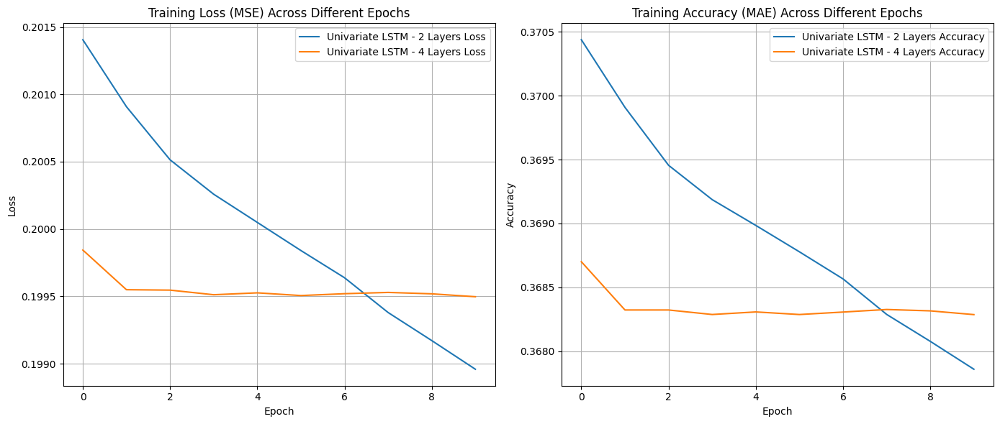

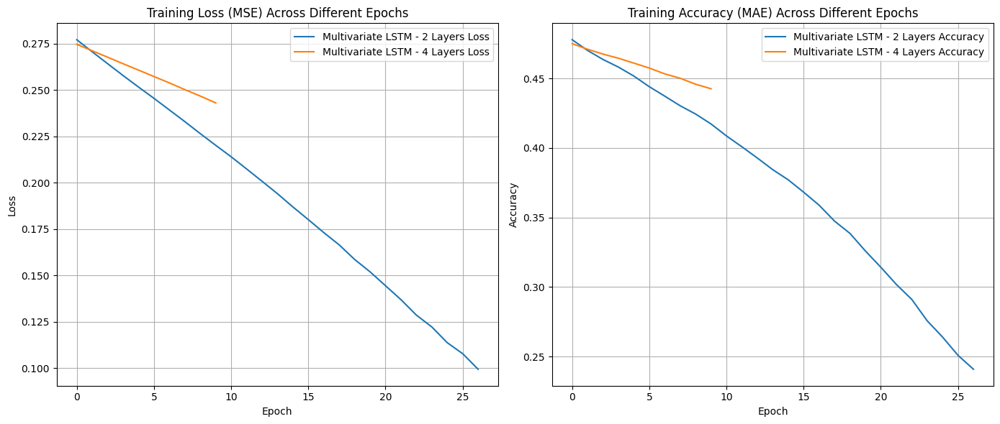

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 419ms/step


2024-12-05 09:17:54,155 - WARNING  - 5 out of the last 5 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002311E046980> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/stepWARNING:tensorflow:6 out of the last 6 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002311E046980> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


2024-12-05 09:17:54,464 - WARNING  - 6 out of the last 6 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002311E046980> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 310ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 393ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 299ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step

Univariate RNN Models RMSE:
Model 1: 140.1364
Model 2: 158.0432

Multivariate RNN Models RMSE:
Model 1: 257.5576
Model 2: 381.2714

Univariate LSTM Models RMSE:
Model 1: 213.2962
Model 2: 211.4959

Multivariate LSTM Models RMSE:
Model 1: 117.5187
Model 2: 138.608


In [14]:
#############################################################
# Creating plots for our Uni and Multi models for both RNN and LSTM
#############################################################
model_labels_uni_lstm = [
    "Univariate LSTM - 2 Layers",
    "Univariate LSTM - 4 Layers"]

model_labels_uni_rnn = [
    "Univariate RNN - 2 Layers",
    "Univariate RNN - 4 Layers"]

model_labels_multi_lstm = [
    "Multivariate LSTM - 2 Layers",
    "Multivariate LSTM - 4 Layers"]

model_labels_multi_rnn = [
    "Multivariate RNN - 2 Layers",
    "Multivariate RNN - 4 Layers"]

EpochsCompare([model_2_layers_uni, model_4_layers_uni], model_labels=model_labels_uni_rnn)
EpochsCompare([model_2_layers_multi, model_4_layers_multi], model_labels=model_labels_multi_rnn)
EpochsCompare([lstm_model_2_layers_uni, lstm_model_4_layers_uni], model_labels=model_labels_uni_lstm)
EpochsCompare([lstm_model_2_layers_multi, lstm_model_4_layers_multi], model_labels=model_labels_multi_lstm)


#############################################################
# Extracting true values
#############################################################
# Function to extract true values from our TimeSeriesGenerator
def get_true_values(generator, max_batches=5):
    true_values = []
    batch_count = 0
    for _, y in generator:
        true_values.extend(y)
        batch_count += 1
        if batch_count >= max_batches:  # Limit to a few batches to avoid long processing
            break
    return np.array(true_values)


#############################################################
# Predictions, true values and transformation for RNN
#############################################################

# Generate Predictions for Univariate Models
pred_uni_rnn_2 = uni_model_2_layers.predict(test_generator_uni)
pred_uni_rnn_4 = uni_model_4_layers.predict(test_generator_uni)

# Generate Predictions for Multi Models
pred_multi_rnn_2 = multi_model_2_layers.predict(test_generator_multi)
pred_multi_rnn_4 = multi_model_4_layers.predict(test_generator_multi)

# Extract True Values
true_uni = get_true_values(test_generator_uni)
true_multi = get_true_values(test_generator_multi)

# Ensure each array is in the correct shape (21, 1)
true_uni = true_uni.reshape(-1, 1)
pred_uni_rnn_2 = pred_uni_rnn_2.reshape(-1, 1)
pred_uni_rnn_4 = pred_uni_rnn_4.reshape(-1, 1)

true_multi = true_multi.reshape(-1, 1)
pred_multi_rnn_2 = pred_multi_rnn_2.reshape(-1, 1)
pred_multi_rnn_4 = pred_multi_rnn_4.reshape(-1, 1)

# Inverse Transform For Univariate
true_uni_inv = scaler.inverse_transform(true_uni)
pred_uni_2_inv_rnn = scaler.inverse_transform(pred_uni_rnn_2)
pred_uni_4_inv_rnn = scaler.inverse_transform(pred_uni_rnn_4)

# Inverse Transform for Multivariate
true_multi_inv = scaler_target.inverse_transform(true_multi)
pred_multi_2_inv_rnn = scaler_target.inverse_transform(pred_multi_rnn_2)
pred_multi_4_inv_rnn = scaler_target.inverse_transform(pred_multi_rnn_4)


#############################################################
# Predictions, true values and transformation for LSTM
#############################################################

# Generate Predictions for Univariate Models
pred_uni_lstm_2 = uni_lstm_model_2_layers.predict(test_generator_uni)
pred_uni_lstm_4 = uni_lstm_model_4_layers.predict(test_generator_uni)

# Generate Predictions for Multi Models
pred_multi_lstm_2 = multi_lstm_model_2_layers.predict(test_generator_multi)
pred_multi_lstm_4 = multi_lstm_model_4_layers.predict(test_generator_multi)

# Ensure each array is in the correct shape (21, 1)
pred_uni_lstm_2 = pred_uni_lstm_2.reshape(-1, 1)
pred_uni_lstm_4 = pred_uni_lstm_4.reshape(-1, 1)

pred_multi_lstm_2 = pred_multi_lstm_2.reshape(-1, 1)
pred_multi_lstm_4 = pred_multi_lstm_4.reshape(-1, 1)

# Inverse Transform For Univariate
pred_uni_2_inv_lstm = scaler.inverse_transform(pred_uni_lstm_2)
pred_uni_4_inv_lstm = scaler.inverse_transform(pred_uni_lstm_4)

# Inverse Transform for Multivariate
pred_multi_2_inv_lstm = scaler_target.inverse_transform(pred_multi_lstm_2)
pred_multi_4_inv_lstm = scaler_target.inverse_transform(pred_multi_lstm_4)


#############################################################
# RMSE for RNN (Uni + Multi) and LSTM (Uni + Multi)
#############################################################

# For RNN
print("\nUnivariate RNN Models RMSE:")
CalculateRMSE(true_multi_inv, [pred_uni_2_inv_rnn, pred_uni_4_inv_rnn])
print("\nMultivariate RNN Models RMSE:")
CalculateRMSE(true_multi_inv, [pred_multi_2_inv_rnn, pred_multi_4_inv_rnn])


# For LSTM
print("\nUnivariate LSTM Models RMSE:")
CalculateRMSE(true_multi_inv, [pred_uni_2_inv_lstm, pred_uni_4_inv_lstm])
print("\nMultivariate LSTM Models RMSE:")
CalculateRMSE(true_multi_inv, [pred_multi_2_inv_lstm, pred_multi_4_inv_lstm])

**Interpretation:**

**NB**: For the same reason stated above the code, we only include the interpretation of the four RNN models.


In this part of the exam, we developed Recurrent Neural Network (RNN) models to forecast Norway's oil production, employing both univariate and multivariate approaches with varying levels of model complexity. The performance of these models was evaluated using Root Mean Squared Error (RMSE), which measures the average magnitude of prediction errors. Notably, all four-layer RNN models ceased training before reaching epoch 10, despite the 'patience' parameter being set to 10

For the univariate RNN models, increasing the number of layers from two to four resulted in an increase in RMSE from 140.1364 to 158.0432. This decline in performance suggests that the deeper four-layer model is less effective at capturing the underlying patterns in Norway's oil production data. The additional layers may have introduced unnecessary complexity, making it harder for the model to generalize from the limited sample size of only 58 observations. This could lead to overfitting, where the model learns noise in the training data rather than the true signal, thereby reducing its predictive accuracy on unseen data. This scenario exemplifies the bias-variance trade-off, where increasing model complexity can lead to higher variance without adequately reducing bias. As a result, the model's ability to generalize worsen despite its enhanced capacity.

Similarly, the multivariate RNN models exhibited a decline in performance with increased complexity. Increasing the number of layers from two to four led to a rise in RMSE from 257.5576 to 381.2714. This substantial increase indicates that deeper architectures are less capable of effectively modeling the complex interactions among multiple input variables, such as oil consumption in Norway, Europe, and the World, OPEC oil production, and gas production in Norway and globally. The additional layers likely introduced overfitting, enabling the model to capture noise and irrelevant patterns in the multivariate data, thereby compromising its predictive performance. This outcome further illustrates the bias-variance trade-off, where the increased model complexity resulted in higher variance without sufficient bias reduction to improve generalization. Moreover, the small dataset size may exacerbate these issues, limiting the effectiveness of more complex multivariate models.

A noteworthy observation from the results is the difference in RMSE between univariate and multivariate RNN models. The two-layer univariate model achieved an RMSE of 140.1364, whereas the two-layer multivariate model had an RMSE of 257.5576. This indicates that incorporating additional variables does not inherently enhance the model's predictive accuracy and may introduce complexities such as multicollinearity or irrelevant features. These challenges can hinder the model's ability to effectively leverage the extra information, especially when constrained by a limited amount of training data.

Overall, the analysis reveals that for forecasting Norway's oil production using RNN models, increasing model complexity by adding layers tends to negatively impact performance in both univariate and multivariate approaches. While deeper models introduce greater capacity to capture complex patterns, in this case, they resulted in higher RMSE, indicating poorer predictive performance. Additionally, univariate models with fewer layers outperform their multivariate counterparts in terms of RMSE, suggesting that the additional variables in the multivariate models do not sufficiently enhance predictive accuracy given the current data and model configurations. This underscores the importance of balancing model complexity with the available data and the relevance of input features to achieve optimal forecasting performance.


#### 2 Image Classification

#### 2.a) Load data and create train and test sample

Number of ship images: 1000
Number of no-ship images: 3000
Image shape in list of ships: (80, 80, 3)
Data Type: float32
Min Pixel Value: 0.0784313753247261
Max Pixel Value: 0.8509804010391235
Training data shape: (3200, 80, 80, 3)
Testing data shape: (800, 80, 80, 3)


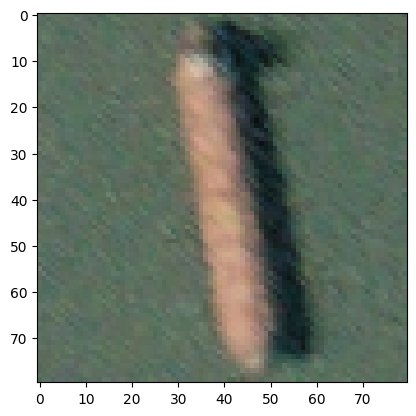

In [15]:
#############################################################
# Loading in the data, splitting into ships(1) and no ships(0)
#############################################################

# Setting folder name
folder_name = 'shipsnet/shipsnet/'

# Read CSV file
data_path_images = os.path.join(data_path, folder_name)

# Generate file list
images = os.listdir(data_path_images)

# Check for valid image files
valid_images = [image for image in images if image.endswith(('.jpg', '.png', '.jpeg'))]

# Create list of ship images
ships = []
noShips = []
for image in valid_images:
    img_path = os.path.join(data_path_images, image)
    # Assume labels are inferred from filenames: '1' indicates ship, '0' indicates no ship
    if image.startswith('1'):
        ships.append(mpimg.imread(img_path))
    elif image.startswith('0'):
        noShips.append(mpimg.imread(img_path))

# Display basic information
print(f"Number of ship images: {len(ships)}")
print(f"Number of no-ship images: {len(noShips)}")

# Print item in list of ships
print(f"Image shape in list of ships: {np.shape(ships[0])}")
print(f"Data Type: {ships[2].dtype}")
print(f"Min Pixel Value: {ships[2].min()}")
print(f"Max Pixel Value: {ships[2].max()}")

# Show image of ship
plt.imshow(ships[0])

##############################################################
# Create training and test set, normalize the data
##############################################################
# Combine ship and noShip
X = np.array(ships+noShips)
y = np.array([1] * len(ships) + [0] * len(noShips))

# Shuffle first and then split the data into train/test samples (stratify to ensure same proportion of ship and noship images (for balances classification))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=y)

print("Training data shape:", X_train.shape)
print("Testing data shape:", X_test.shape)

#### 2.a) Build, compile and fit CNN.
Note 1: Discuss the choice of the number of layers and neurons.
Note 2: Use class weights to balance the training sample. Inspect loss and accuracy across epichs using graphs.

{0: 0.25, 1: 0.75}


c:\Users\henrik.knudsen\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 78, 78, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 39, 39, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,142,081 (4.36 MB)

 Trainable params: 1,142,081 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

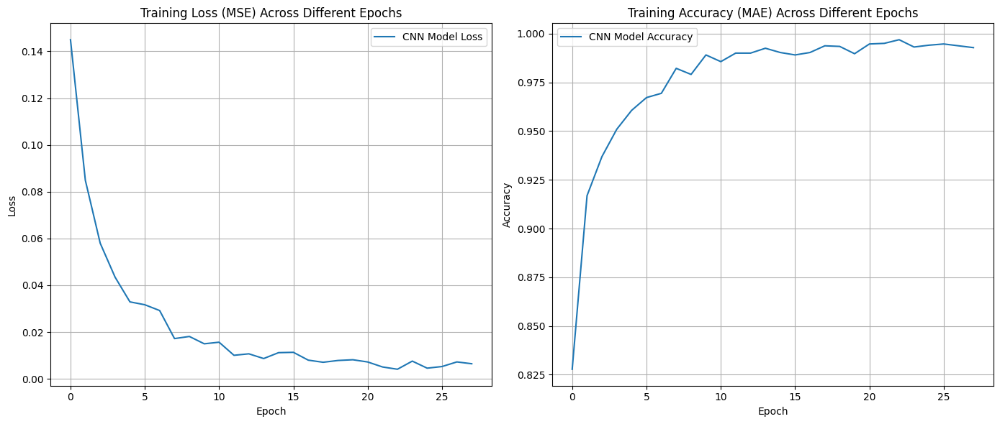

In [16]:
##############################################################
# Class Weights, Input Shape and Early Stopping
##############################################################
# Computing class weights
cw0 = np.mean(y_train)
cw1 = 1.0 - cw0
class_weights = {0:cw0, 1:cw1}

# Printing out the result from class_weights
print(class_weights)

# Input shape based on image dimensions
input_shape = X_train.shape[1:]

# Define Early Stopping and learning rate
early_stop = EarlyStopping(monitor='val_loss', patience=15, min_delta=0.001, restore_best_weights=True)
learning_rate = 0.001

##############################################################
# Create, build and train our CNN
##############################################################
def create_cnn_model(input_shape):
    model = Sequential()
    
    # First Convolutional Block
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    
    # Second Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    
    # Third Convolutional Block
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    
    # Flatten the output
    model.add(Flatten())
    
    # Fully Connected Dense Layer
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))  # Dropout to prevent overfitting
    
    # Output Layer
    model.add(Dense(1, activation='sigmoid'))
    
    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy'])
    
    # Return final model
    return model


# Create our CNN
cnn_model = create_cnn_model(input_shape)

# Display model architecture
cnn_model.summary()

# Fit and train the model
model_cnn_ = cnn_model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    class_weight=class_weights, verbose=0)


model_labels_cnn = ["CNN Model"]
EpochsCompare([model_cnn_], model_labels=["CNN Model"])

Interpretation and Discussion

**Imbalance**

Since the dataset consists of 1000 ship-containing images and 3000 images without ships, we needed to address the class imbalance inherent in the dataset, class weights were computed as {0: 0.667, 1:2.0}. This weighting strategy ensures that the model places greater emphasis on correctly classifying the minority class (ships), thereby improving its ability to detect ships despite their lower frequence in the dataset. 


**Convolutional Layers (Conv2D)**
* These layers are responsible for extracting spatial hierarchies of features from the input images. They apply a set of learnable filters to the input data, enabling the model to detect various features such as edges, textures, and more complex patterns as the network deepens. We go from 32 filters with a kernel size of (3,3) to capture basic features, to 64 filters for enabling the extraction of more intricate patterns and finally 128 filters to capture highly complex and abstract features.
* Activation function is ReLU and was employed in all convolutional layers. ReLU introduces non-linearity, allowing the network to learn and model more complex relationships within the data by enabling faster and more effective training.

**Pooling Layers (MaxPooling2D)**
* These layers reduce the spatial dimensions (height and width) of the feature maps generated by the convolutional layers. This dimensionality reduction helps in controlling overfitting, decreasing the computational load and ensuring that the network focuses on the most prominent features.
* A (2,2) pooling window was used consistently after each convolutional block, effectively halving the spatial dimensions at each step.

**Flatten Layer**
* Convert 2D feature maps into a 1D feature vector to feed into the Dense Layers.

**Dense Layers**
* These fully connected layers perform the final classification based on the features extracted by the convolutional layers.
* The first dense layer contains 128 neurons with a ReLU activation function. The high number of neurons allows the network to learn complex combinations of features.
* Our Dropout layer was applied to avoid overfitting by randomly disabling 50% of neurons during training, promoting the networks ability to generalize.

**Output Layer**
* Consists of a single neuron with a sigmoid activation function, suitable for binary classification tasks, as that is what the task is all about. The sigmoid function outputs probabilities between 0 and 1, effectively indicating the presence or absence of a ship in the image.


#### Training process and accuracy
The rapid decrease in loss and corresponding increase in accuracy demonstrates that the CNN was highly effective in learning the distinguishing features between ship and no-ship images. However, the near-perfect accuracy and loss values raise concerns about potential overfitting. Even though we had implemented early stopping in addition to class weights, we still see strong evidence of overfitting. In the process of determining the parameter values for our CNN, we have tested with different learning rates, patience, epoch sizes, batch sizes and weight classes. 


#### 2.b) Load the Satellite Image and split it into 200 80 pixel x 80 pixel images. Predict for each image if a ship is shown. Output the 200 images using a subplot with 10 rows and 20 columns and indicate if a ship is shown. Count how many ships the neural network identfies. Discuss limitations of the approach. 

Note: the image is 800 x 1600 pixels.

Data Type: float32
Min Pixel Value: 0.0
Max Pixel Value: 0.9843137264251709
Total Patches: 200
Shape of each patch: (80, 80, 3)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
CNN Prediction Distribution: {0: 198, 1: 2}
Total Ships identified: 2 ship(s) in 200 patches



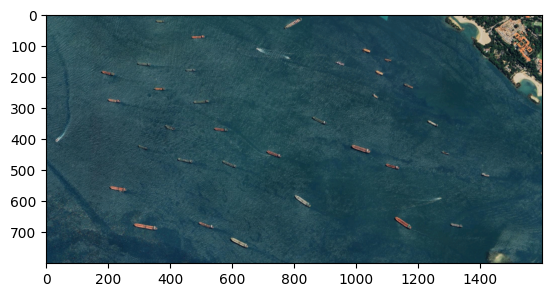

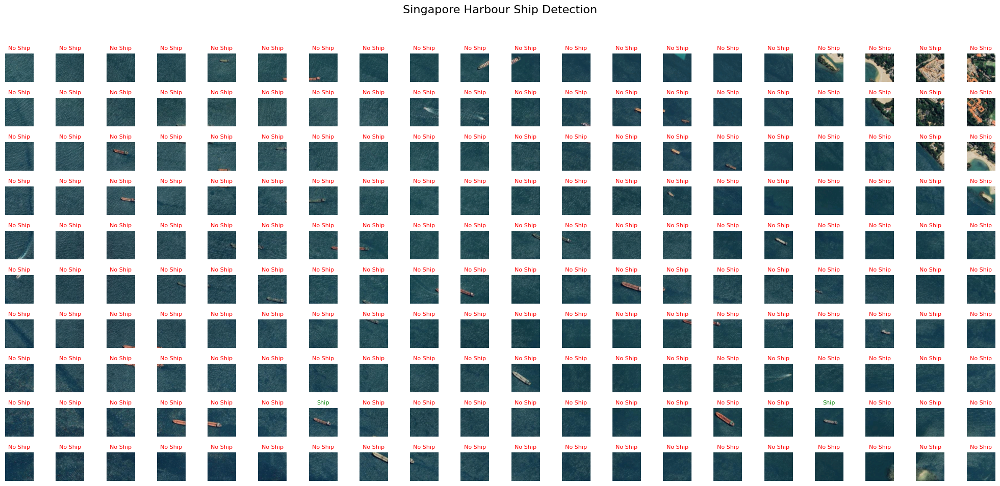

In [17]:
##############################################################
# Importing the image, and check dtype and needs of normalization
##############################################################
# Setting folder name
file_name = 'SingaporeHarbour.png'

# Read CSV file
data_path_image = os.path.join(data_path, file_name)

# Load the satelitte image
sat_image = mpimg.imread(data_path_image)

# Show Image
plt.imshow(sat_image)

# Check the data type and pixel values
print(f"Data Type: {sat_image.dtype}")
print(f"Min Pixel Value: {sat_image.min()}")
print(f"Max Pixel Value: {sat_image.max()}")

##############################################################
# Splitting image into 200 80x80 pixel images
##############################################################

# Define patch size
patch_height = 80
patch_width = 80

# Calculate the number of patches
num_patches_height = sat_image.shape[0] // patch_height  
num_patches_width = sat_image.shape[1] // patch_width    

# Initialize lists to store patches and patch positions
patches = []

for i in range(0, sat_image.shape[0], patch_height):
    for j in range(0, sat_image.shape[1], patch_width):

        # Extract the patch
        patch = sat_image[i:i+patch_height, j:j+patch_width]
        patches.append(patch)


# Convert patches to a numpy array
patches = np.array(patches)
print(f"Total Patches: {patches.shape[0]}")
print(f"Shape of each patch: {patches[0].shape}")

##############################################################
# Make Predictions
##############################################################
predictions_prob = cnn_model.predict(patches)
predictions = (predictions_prob >= 0.5).astype(int).reshape(-1)

##############################################################
# Creating a function for prediction summarizations
##############################################################
def summarize_predictions(predictions, label):
    unique, counts = np.unique(predictions, return_counts=True)
    prediction_distribution = dict(zip(unique, counts))
    total_ships = np.sum(predictions)
    print(f"{label} Prediction Distribution: {prediction_distribution}")
    print(f"Total Ships identified: {total_ships} ship(s) in {len(predictions)} patches\n")

summarize_predictions(predictions, "CNN")

##############################################################
# Plot creation
##############################################################
rows = num_patches_height
columns = num_patches_width
fig, axes = plt.subplots(rows, columns, figsize=(20, 10))
fig.suptitle("Singapore Harbour Ship Detection", fontsize=16)

# Flatten axes array
axes = axes.flatten()

for idx, ax in enumerate(axes):
    # Display the patch
    ax.imshow(patches[idx])
    # Remove axis ticks
    ax.axis('off')
    # Add title indicating prediction
    if predictions[idx] == 1:
        ax.set_title("Ship", color='green', fontsize=8)
    else:
        ax.set_title("No Ship", color='red', fontsize=8)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()


Interpretation and Discussion


The CNN sucessfully identified 2 ships in the 200 patches analyzed, however by manual counting we came to 12 ships in the 200 patches. So our model has a 10/12 false negative (type II error). This count slightly aligns with the expectation that ships occupy a minor fraction fo the harbor area, especially in patches where ships are sparsely distributed or partially visible within each patches. We see, compared to the manual counting, the CNN under-detect the ships present in the patches. These results can come from factors such as ships being partially obscured, positioned near patch boundaires or presenting minimal visual features wihtin the 80x80 pixel constraint. In order to counter the potentential pixel constraints, we could simply apply larger patches or overlapping regions, which might provide more comprehensive context for the CNN. This is because ships located near edges, which is a attribute for a lot of the patches containing ships, leads to a potential incomplete feature representation and potential misclassification (type II error).

Although class weights were employed to address the imbalance between ship and no-ship classes, the inherent imbalance still impact the CNN's ability to generalize effectively, particularly for the minority class (ships). We also need to consider the discussion we had above, regarding the potential overfitting, where the model is too adapted for the training data, which will naturally affect the prediction for ships / no-ships in the patches of the harbor image. 



## 2.c) Create Lime images 
Note: save the image and mask in a ndarray. For each image run 500 samples with 10 top labels and 20 features.

In [18]:
##############################################################
# CNN predictions
##############################################################
def cnn_predict(images):
    images = np.array(images)
    preds = cnn_model.predict(images, verbose=0)
    return np.concatenate((1-preds, preds), axis = 1)


##############################################################
# Creating Lime Images
##############################################################
# Initialize the LIME Explainer
explainer = lime_image.LimeImageExplainer()

# Initialize lists to store LIME explanation images and masks
explanation_images = []
masks = []
for idx in tqdm(range(len(patches)), desc="Generating LIME explanations"):
    image = patches[idx]

    # Genertae LIME explanation
    explanation = explainer.explain_instance(image, classifier_fn=cnn_predict, top_labels=2, hide_color=0, num_samples=500)
    
    # Get the explanation for the predicted class of each image
    predicted_class = predictions[idx]

    # Generate the explanation image and mask
    temp, mask = explanation.get_image_and_mask(label=predicted_class, positive_only=True, num_features=20, hide_rest=False)

    # Overlay mask on the image for visualization
    if temp.max() > 1.0:
        img_with_mask = mark_boundaries(temp / 255.0, mask)
    else:
        img_with_mask = mark_boundaries(temp, mask)
    

    # Appending the result image and mask to list
    explanation_images.append(img_with_mask)
    masks.append(mask)


# Convert the lists to ndarrays
explanation_images = np.array(explanation_images)
masks = np.array(masks)

Generating LIME explanations: 100%|██████████| 200/200 [09:59<00:00,  3.00s/it]


#### 2.c) Create 10 x 20 Table with the lime verification highlighting which area fits the prediction and which does not.

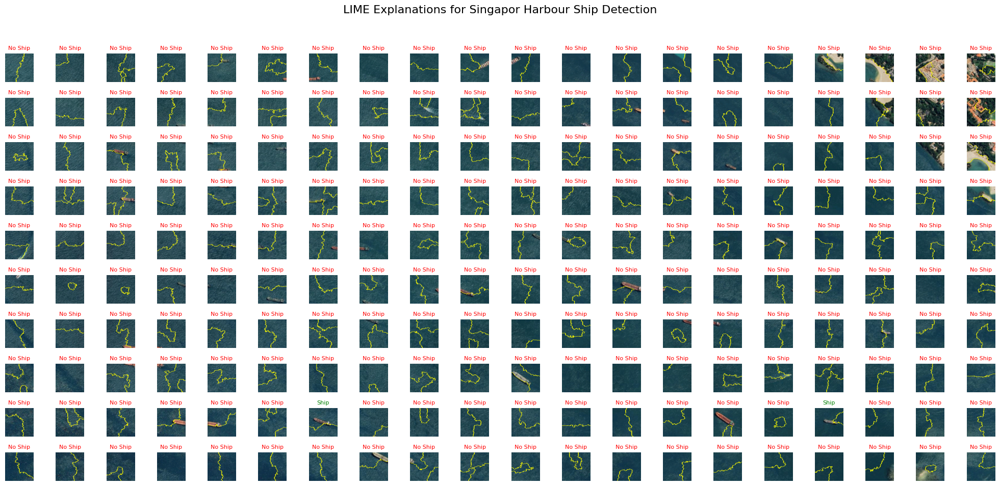

In [19]:
# We can use the same variables as above for rows and columns
rows_lime = rows
columns_lime = columns
fig, axes = plt.subplots(rows_lime, columns_lime, figsize=(20,10))
fig.suptitle("LIME Explanations for Singapor Harbour Ship Detection", fontsize = 16)

# Flatte axes array
axes = axes.flatten()

for idx, ax in enumerate(axes):
    ax.imshow(explanation_images[idx])
    # Remove axis ticks
    ax.axis("off")
    # Add title indicating prediction
    if predictions[idx] == 1:
        ax.set_title("Ship", color="green", fontsize=8)
    else:
        ax.set_title("No Ship", color="red", fontsize=8)


plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()

**Interpretation**

The yellow/green boundary highlights in the images show which features most strongly influenced the model's decisions. For most patches labeled "No Ship," we can see the model is detecting and highlighting:
* Coastline contours
* Water-land boundaries
* Dock structures
* Wake patterns in the water

The few patches labeled as "Ship" stand out because they contain very distinct linear structures with high contrast against the water background. These highlights closely match actual ship shapes, suggesting the model has learned to identify ships based on their characteristic rectangular/elongated geometry.
What's particularly interesting is that even though many patches contain linear features (like docks or coastal structures), the model is being quite conservative in its ship classifications. This suggests it has learned to distinguish between different types of linear features - not just detecting straight lines, but specifically looking for the combination of shape, size, and contrast that characterizes ships in satellite imagery.
The model appears to be making reasonable decisions, though it may be erring on the side of caution to avoid false negatives. The LIME explanations confirm it's focusing on relevant visual features for ship detection rather than spurious correlations in the data.

#### 3.a) Build a autoencoder using a convolutional neural network with 4 layers.

In [20]:
##############################################################
# Building Autoencoder using CNN
##############################################################
def create_cnn_autoencoder(latent_dim):
    input_img = Input(shape=(80, 80, 3))
    # Encoder
    x = Conv2D(latent_dim, (3, 3), activation="relu", padding="same")(input_img)
    encoded = MaxPooling2D((2, 2), padding="same")(x)

    # Decoder
    x = Conv2D(latent_dim, (3, 3), activation="relu", padding="same")(encoded)
    x = UpSampling2D((2, 2))(x)
    decoded = Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

    # AutoEncoder model
    autoencoder = Model(input_img, decoded)

    # Compiling the model
    autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    # Return AutoEncoder model
    return autoencoder


# Calling on our function
full_autoencoder = create_cnn_autoencoder(latent_dim=32)

ships_only_autoencoder = create_cnn_autoencoder(latent_dim=32)

# Summary of our "full" model
full_autoencoder.summary()

Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 80, 80, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 80, 80, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 40, 40, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 40, 40, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 80, 80, 3)      │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,011 (43.01 KB)

 Trainable params: 11,011 (43.01 KB)

 Non-trainable params: 0 (0.00 B)

#### 3.b) Create new training and test data. Add noise to data.

In [21]:
##############################################################
# Zero-Mean Guassian noise
##############################################################
# We will follow the lecture 10 notes Autoencoder on adding random noise 
def add_noise(data, noise_factor=0.1):
    noisy_data = data + noise_factor * np.random.normal(loc=0.0, scale=1.0, size = data.shape)

    # We only want values which are within [0, 1]
    noisy_data = np.clip(noisy_data, 0.0, 1.0) 
    return noisy_data


# Add noise to training and test data
X_train_noisy = add_noise(X_train)
X_test_noisy = add_noise(X_test)

# Filter ship images from training and test data
X_train_ships = np.array([img for img, label in zip(X_train, y_train) if label == 1])
X_test_ships = np.array([img for img, label in zip(X_test, y_test) if label == 1])

# Add noise to ship-only dataset
X_train_ships_noisy = add_noise(X_train_ships)
X_test_ships_noisy = add_noise(X_test_ships)

#### 3.b) Train the model with the full dataset and the subsample

In [22]:
# Define Early Stopping and learning rate for both models
early_stop = EarlyStopping(monitor='val_loss', patience=15, min_delta=0.001, restore_best_weights=True)

##############################################################
# Train the model with the full Dataset (both 0 and 1)
##############################################################
autoencoder_full = full_autoencoder.fit(
    X_train_noisy, X_train,
    epochs=400,
    batch_size=32,
    shuffle=True,
    callbacks = [early_stop],
    validation_data=(X_test_noisy, X_test),
    verbose=0)


##############################################################
# Train the model with ship images only (1)
##############################################################
autoencoder_ships_only = ships_only_autoencoder.fit(
    X_train_ships_noisy, X_train_ships,
    epochs=200,
    batch_size=32,
    shuffle=True,
    callbacks = [early_stop],
    validation_data=(X_test_ships_noisy, X_test_ships),
    verbose=0)

#### 3.b) Plot the loss for both trained networks

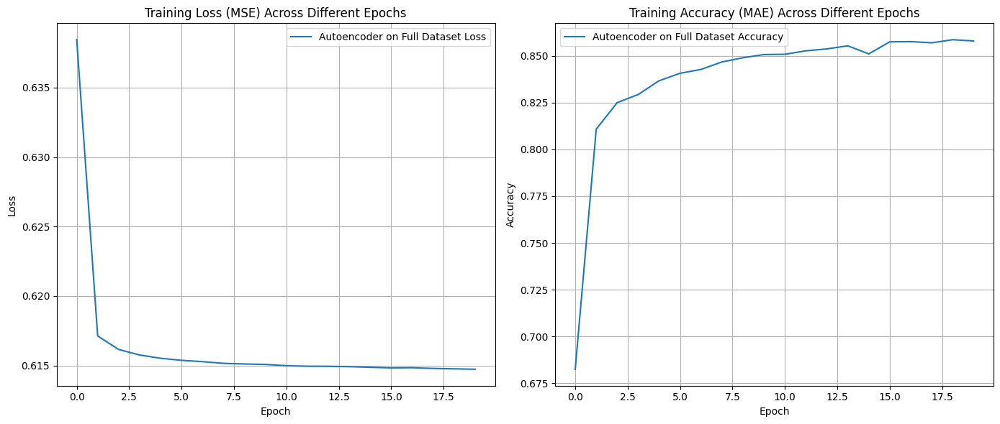

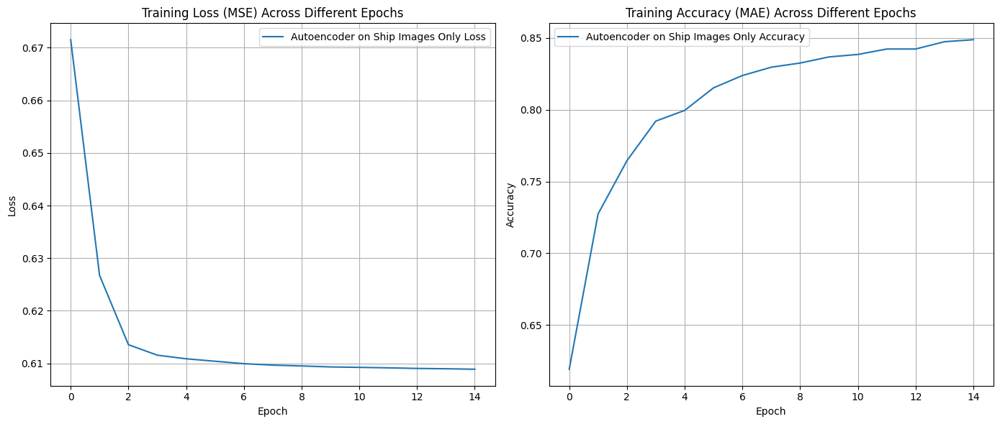

In [23]:
# Display the training progress for full dataset
EpochsCompare([autoencoder_full], model_labels=["Autoencoder on Full Dataset"])

# Display the training progress for the ships-only dataset
EpochsCompare([autoencoder_ships_only], model_labels=["Autoencoder on Ship Images Only"])

Interpretation:


Both Autoencoders demonstrated a consistent reduction in loss during the initial epochs, indicating effective learning of image reconstruction. The stabilization of loss values suggests that the models reached a convergence point where further training did not yield significant improvements. The rising accuracy trends for both models signify an increasing proportion of correctly reconstructed pixels. However, the relatively high accuracy achieved by the Full Dataset Autoencoder compared to the Ships-Only Autoencoder suggests better generalization across diverse image types. The Ships-Only Autoencoder converged more rapidly, achieving stable loss and accuracy within fewer epochs (14 epochs) compared to the Full Dataset Autoencoder (18 epochs). This rapid convergence is likely due to the reduced complexity and diversity of the training data, allowing the model to learn ship-specific features more quickly.

#### 3.c) Add random noise to the Satellite Image of Singapore.

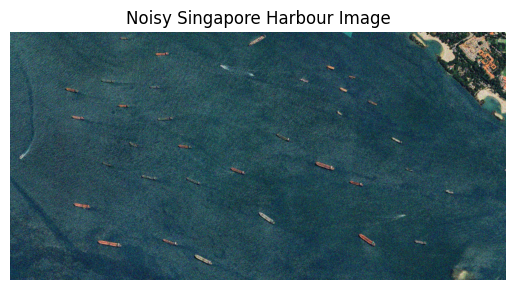

Total Patches: 200
Shape of each patch: (80, 80, 3)


In [24]:
# We utilize our function to create a noisy image
sat_image_noisy = add_noise(sat_image, noise_factor=0.1)

# Display the noisy image just to understand how the picutre looks now
plt.imshow(sat_image_noisy)
plt.title("Noisy Singapore Harbour Image")
plt.axis('off')
plt.show()

##############################################################
# Splitting the noisy image into 200 80x80 pixel images
##############################################################

# Calculate the number of patches (H=80 and W=80)
num_patches_height = sat_image_noisy.shape[0] // patch_height  
num_patches_width = sat_image_noisy.shape[1] // patch_width    

# Initialize lists to store patches and patch positions
noisy_patches = []

for i in range(0, sat_image_noisy.shape[0], patch_height):
    for j in range(0, sat_image_noisy.shape[1], patch_width):

        # Extract the patch
        patch = sat_image_noisy[i:i+patch_height, j:j+patch_width]
        noisy_patches.append(patch)


# Convert patches to a numpy array
noisy_patches = np.array(noisy_patches, dtype="float32")
print(f"Total Patches: {noisy_patches.shape[0]}")
print(f"Shape of each patch: {noisy_patches[0].shape}")


#### 3.c) Denoise the image using entire data:

In [25]:
# We utilize the Autoencoder which has been trained on the whole data set to denoise the Singapore Harbour Image
denoised_pred_full = full_autoencoder.predict(noisy_patches, verbose=0)

#### 3.c) Denoise the image using only ships:

In [26]:
# We utilize the Autoencoder which has been trained on the data set which only contains ships in order to denoise the Singapore Harbour Image
denoised_pred_ships = ships_only_autoencoder.predict(X_test_ships_noisy, verbose=0)

#### 3.c) Classify the denoised images and present them in the same fashion as you did in exercise 2 b). 

Autoencoder Denoised Full Dataset Prediction Distribution: {0: 199, 1: 1}
Total Ships identified: 1 ship(s) in 200 patches

Autoencoder Denoised Ships Dataset Prediction Distribution: {0: 200}
Total Ships identified: 0 ship(s) in 200 patches



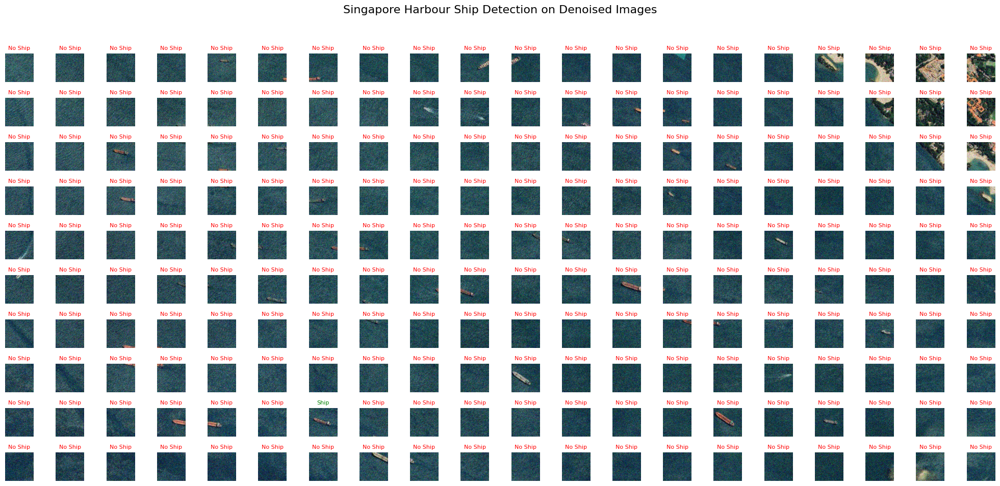

In [27]:
##############################################################
# Classify the denoised image from the Full Autoencoder
##############################################################
predictions_prob_full_denoised = cnn_model.predict(denoised_pred_full, verbose=0)
predictions_full_denoised = (predictions_prob_full_denoised > 0.5).astype(int).reshape(-1)

# Summarize the prediction
summarize_predictions(predictions_full_denoised, "Autoencoder Denoised Full Dataset")


##############################################################
# Classify the denoised image from the Ships_only Autoencoder
##############################################################
predictions_prob_ships_denoised = cnn_model.predict(denoised_pred_ships, verbose=0)
predictions_ships_denoised = (predictions_prob_ships_denoised > 0.5).astype(int).reshape(-1)

# Summarize the prediction
summarize_predictions(predictions_ships_denoised, "Autoencoder Denoised Ships Dataset")


##############################################################
# Plotting the denoised patches with their predictions
##############################################################
rows = num_patches_height
columns = num_patches_width
fig, axes = plt.subplots(rows, columns, figsize=(20, 10))
fig.suptitle("Singapore Harbour Ship Detection on Denoised Images", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx, ax in enumerate(axes):
    # Display the denoised patch
    ax.imshow(noisy_patches[idx])
    # Remove axis ticks
    ax.axis('off')
    # Add title indicating prediction
    if predictions_full_denoised[idx] == 1:
        ax.set_title("Ship", color='green', fontsize=8)
    else:
        ax.set_title("No Ship", color='red', fontsize=8)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()


Interpretation

For this sub-question, we employed Convolutional Neural Network-based Autoencoders to enhance the quality of satellite images from Singapore Harbour by denoising them. The primary objective was to evaluate the effectiveness of Autoencoders in mitigating noise and subsequently assess the impact of denoising on the CNN's ability to accurately classify image patches as containing ships or not. The process involved two distinct Autoencoders: one trained on the entire dataset, which included both ship and no-ship images (autoencoder_full), and another trained exclusively on ship-containing images (autoencoder_ships_only). The denoised images were then subjected to classification using a pre-trained CNN model designed to identify ships within image patches. We added zero-mean Gaussian noise to the images, as recommended in the lecture slides.

The use of CNN-based Autoencoders for denoising satellite images showed limited effectiveness in accurately classifying ships. The autoencoder_full was able to retain enough ship-related details to allow the CNN to correctly identify 1 ship out of 12 total ships present in 200 image patches. Conversely, the autoencoder_ships_only failed to detect any ships, resulting in 0 ships identified out of the same number of patches. These results highlight the significant challenge of balancing effective noise removal with the preservation of essential features necessary for downstream classification tasks.

There are some key factors explaining the differin performances of the two Autoencoders, however one that stands out is the training phase of the two models. The autoencoder_full, trained on a diverse dataset containing both ship and no-ship images, likely learned a more generalized representation of features necessary for effective denoising. This generalization helped preserve some ship-related details despite the added noise. In contrast, the autoencoder_ships_only, limited to ship-containing images, may have overfitted to specific features of ships, making it less effective at denoising images where ships are not present or when noise patterns vary.

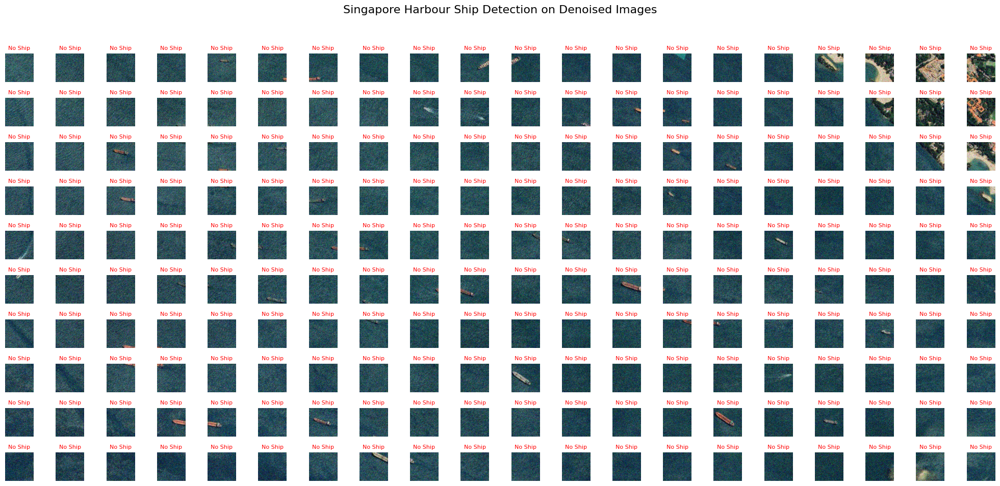

In [28]:
# We felt the need to plot again, however now based on the Ship Only Autoencoder (just for comparison)
rows = num_patches_height
columns = num_patches_width
fig, axes = plt.subplots(rows, columns, figsize=(20, 10))
fig.suptitle("Singapore Harbour Ship Detection on Denoised Images", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx, ax in enumerate(axes):
    # Display the denoised patch
    ax.imshow(noisy_patches[idx])
    # Remove axis ticks
    ax.axis('off')
    # Add title indicating prediction
    if predictions_ships_denoised[idx] == 1:
        ax.set_title("Ship", color='green', fontsize=8)
    else:
        ax.set_title("No Ship", color='red', fontsize=8)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()
